In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

In [2]:
file  = './data/AMOS/processed/20191216.csv'
data = pd.read_csv(file, index_col='LOCALDATE (BEIJING)', parse_dates=True)
data = data.drop('LIGHTS', axis=1)
data[['RVR_1A', 'MOR_1A']] = data[['RVR_1A', 'MOR_1A']].apply(np.log10)
data

,RVR_1A,MOR_1A,PAINS (HPA),QNH AERODROME (HPA),QFE R06 (HPA),TEMP (°C),RH (%),DEWPOINT (°C),WS2A (MPS),WD2A,CW2A (MPS)
LOCALDATE (BEIJING),,,,,,,,,,,
2019-12-15 08:00:00,3.477121,3.845098,1023.3,1024.84,1023.28,8.6,90.0,7.06,3.78,86.0,1.78
2019-12-15 08:00:15,3.477121,3.845098,1023.3,1024.84,1023.28,8.6,90.0,7.06,3.81,87.0,1.85
2019-12-15 08:00:30,3.477121,3.845098,1023.3,1024.84,1023.28,8.6,90.0,7.06,3.82,88.0,1.91
2019-12-15 08:00:45,3.477121,3.845098,1023.3,1024.84,1023.28,8.6,90.0,7.06,3.77,88.0,1.89
2019-12-15 08:01:00,3.477121,3.845098,1023.3,1024.84,1023.28,8.6,90.0,7.06,3.74,89.0,1.93
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-16 07:58:45,2.301030,1.698970,1016.6,1018.14,1016.58,10.6,100.0,10.60,2.71,90.0,1.43
2019-12-16 07:59:00,2.301030,1.698970,1016.6,1018.14,1016.58,10.6,100.0,10.60,2.64,90.0,1.40
2019-12-16 07:59:15,2.301030,1.698970,1016.6,1018.14,1016.58,10.6,100.0,10.60,2.61,90.0,1.38


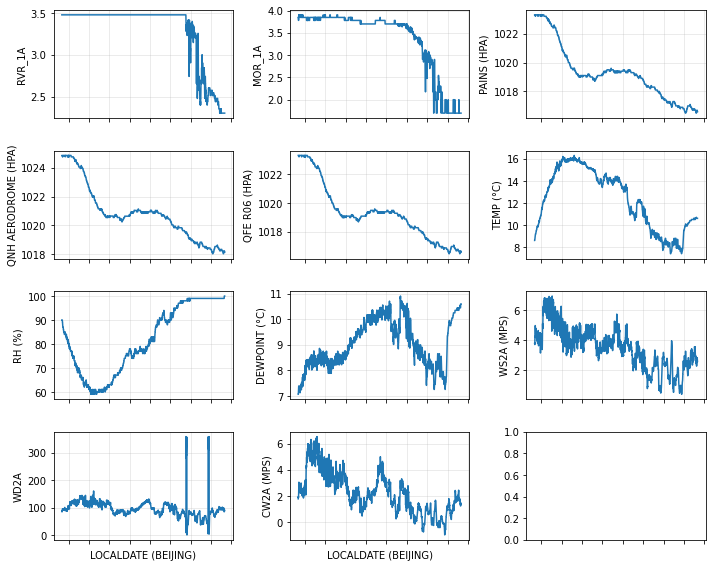

In [3]:
fig, ax = plt.subplots(4, 3, figsize=(10,8), sharex=True)
ax = ax.flatten()
for col, ax_i in zip(data.columns, ax):
    data[col].plot(ax=ax_i)
    ax_i.grid('--', alpha=.3)
    ax_i.set_ylabel(col)
    ax_i.set_xticklabels([])
ax[-1].set_xticklabels([])
plt.tight_layout()

观察因变量（RVR_1A，MOR_1A）与自变量的分布关系

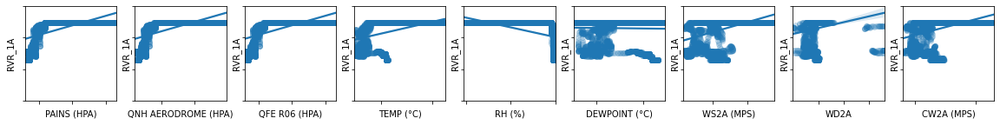

In [4]:
X = data.columns.drop(['RVR_1A', 'MOR_1A']).values.tolist()
fig, ax = plt.subplots(1, 9, sharey=True, figsize=(20,2))
for x, ax_i in zip(X, ax.flatten()):
    sns.regplot(x=x, y='RVR_1A', data=data, ax=ax_i, scatter_kws=dict(alpha=.2))
    ax_i.set_ylim(1, 4)
    ax_i.set_xticklabels([])
    ax_i.set_yticklabels([])

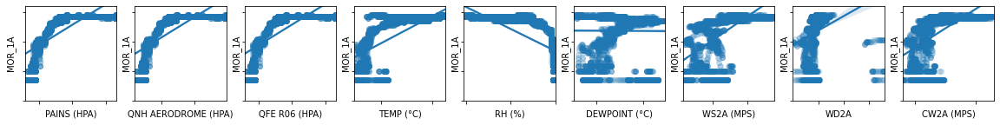

In [5]:
fig, ax = plt.subplots(1, 9, sharey=True, figsize=(20,2))
for x, ax_i in zip(X, ax.flatten()):
    sns.regplot(x=x, y='MOR_1A', data=data, ax=ax_i, scatter_kws=dict(alpha=.2))
    ax_i.set_ylim(1, 4.2)
    ax_i.set_xticklabels([])
    ax_i.set_yticklabels([])

求各变量的相关关系

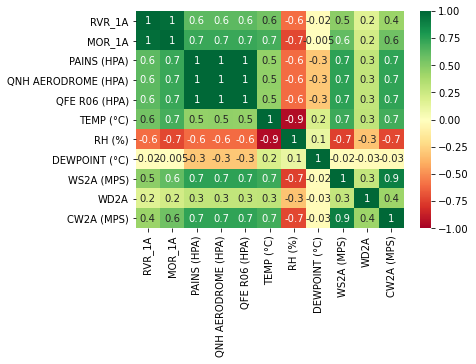

In [6]:
corr_metrix = data.corr()
sns.heatmap(corr_metrix, annot=True, vmax=1, vmin=-1, fmt='.1g', cmap="RdYlGn")

分别对两个因变量分析自变量与其的相关关系

In [7]:
rvr_corr = corr_metrix['RVR_1A'].drop(['RVR_1A','MOR_1A'])
mor_corr = corr_metrix['MOR_1A'].drop(['RVR_1A','MOR_1A'])
print(rvr_corr)
print(mor_corr)

PAINS (HPA)            0.618156
QNH AERODROME (HPA)    0.618060
QFE R06 (HPA)          0.618172
TEMP (°C)              0.554965
RH (%)                -0.598324
DEWPOINT (°C)         -0.022253
WS2A (MPS)             0.476660
WD2A                   0.171487
CW2A (MPS)             0.433998
Name: RVR_1A, dtype: float64
PAINS (HPA)            0.713047
QNH AERODROME (HPA)    0.713097
QFE R06 (HPA)          0.713064
TEMP (°C)              0.684209
RH (%)                -0.724375
DEWPOINT (°C)         -0.005356
WS2A (MPS)             0.608579
WD2A                   0.225230
CW2A (MPS)             0.566242
Name: MOR_1A, dtype: float64


线形回归预测

In [8]:
reg = linear_model.LinearRegression()
X = data.drop(['RVR_1A', 'MOR_1A'], axis=1)
y_rvr = data['RVR_1A']
y_mor = data['MOR_1A']

y_rvr_hat = reg.fit(X, y_rvr).predict(X)
print('--- RVR_1A ---')
print('parameters = %s' % [round(i,3) for i in reg.coef_])
print('mse = %s' % mean_squared_error(y_true=y_rvr, y_pred=y_rvr_hat))
print('R^2 = %s\n' % reg.score(X, y_rvr))

print('--- MOR_1A ---')
y_mor_hat = reg.fit(X, y_mor).predict(X)
print('parameters = %s' % [round(i,3) for i in reg.coef_])
print('mse = %s' % mean_squared_error(y_true=y_mor, y_pred=y_mor_hat))
print('R^2 = %s' % reg.score(X, y_mor))

--- RVR_1A ---
parameters = [6.282, -12.562, 6.377, -0.515, -0.117, 0.527, -0.081, -0.0, -0.028]
mse = 0.05364726098975691
R^2 = 0.5972079381914313

--- MOR_1A ---
parameters = [8.027, -17.091, 9.265, -0.896, -0.209, 0.971, -0.133, -0.0, -0.046]
mse = 0.12873635727549484
R^2 = 0.7563089193394574
